## DATASET INITIATOR & SAMPLER

In [1]:
import os
import cv2
from IPython.display import display, clear_output
from PIL import Image
import numpy as np

In [2]:
DATASET_DIR = 'dataset'
IMG_SIZE = (224, 224)
COLOR_MODE = 'RGB'

In [9]:
def validate_face(face, min_face_size=50, aspect_ratio_threshold=(0.8, 1.2), blur_threshold=100.0):
    h, w, _ = face.shape

    # Check if the face is too small
    if min(w, h) < min_face_size:
        print(f"Skipping: Face too small (w={w}, h={h}).")
        return False

    # Check if the aspect ratio is valid
    aspect_ratio = w / h
    if not (aspect_ratio_threshold[0] <= aspect_ratio <= aspect_ratio_threshold[1]):
        print(f"Skipping: Invalid aspect ratio {aspect_ratio:.2f}.")
        return False

    # Check if the image is blurry
    gray_face = cv2.cvtColor(face, cv2.COLOR_BGR2GRAY)
    laplacian_var = cv2.Laplacian(gray_face, cv2.CV_64F).var()
    if laplacian_var < blur_threshold:
        print(f"Skipping: Image is blurry (Laplacian variance={laplacian_var:.2f}).")
        return False

    return True

def detect_face(img, face_classifier):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_classifier.detectMultiScale(
        gray,
        scaleFactor=1.3,
        minNeighbors=10,
        minSize=(80, 80)
    )

    if len(faces) > 0:
        faces = sorted(faces, key=lambda x: x[2] * x[3], reverse=True)
        x, y, w, h = faces[0]
        aspect_ratio = w / h
        if 0.8 <= aspect_ratio <= 1.2:
            return img[y:y+h, x:x+w]
        else:
            print(f"Skipping: Invalid aspect ratio {aspect_ratio:.2f}.")
    else:
        print("No face detected.")

    return None

def collect_samples(user_id, sample_count, img_size=IMG_SIZE):
    user_dir = os.path.join(DATASET_DIR, user_id)
    os.makedirs(user_dir, exist_ok=True)
    face_classifier = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")

    existing_count = len(os.listdir(user_dir))

    cap = cv2.VideoCapture(0)
    if not cap.isOpened():
        print("Error: Unable to access the webcam.")
        return

    valid_samples = 0
    try:
        while valid_samples < sample_count:
            ret, frame = cap.read()
            if not ret:
                print("Failed to capture frame. Retrying...")
                continue

            face = detect_face(frame, face_classifier)
            if face is not None and validate_face(face):
                resized_face = cv2.resize(face, img_size)
                img_path = os.path.join(user_dir, f"{user_id}_{existing_count + valid_samples + 1:04d}.jpg")
                cv2.imwrite(img_path, resized_face)
                valid_samples += 1

                # Real-time display in Jupyter Notebook
                clear_output(wait=True)
                pil_image = Image.fromarray(cv2.cvtColor(resized_face, cv2.COLOR_BGR2RGB))
                display(pil_image)
                print(f"Collecting: {valid_samples}/{sample_count}")
            else:
                print("Invalid or no face detected. Skipping...")
    except KeyboardInterrupt:
        print("Interrupted by user.")
    finally:
        cap.release()
        clear_output(wait=True)
        print(f"Collection complete for {user_id}.")
        print(f"New samples collected: {valid_samples}. Total images: {existing_count + valid_samples}.")

def get_next_user_id(existing_users):
    ids = [int(user.split("_")[1]) for user in existing_users if user.startswith("user_") and user.split("_")[1].isdigit()]
    return f"user_{(max(ids) + 1) if ids else 1:03d}"

# Main block
os.makedirs(DATASET_DIR, exist_ok=True)
existing_users = [d for d in os.listdir(DATASET_DIR) if os.path.isdir(os.path.join(DATASET_DIR, d))]
print(f"Existing users: {', '.join(existing_users) if existing_users else 'None'}")

action = input("Do you want to add to an existing user or create a new one? (add/new): ").strip().lower()
if action == "add" and existing_users:
    user_id = input(f"Enter a user ID ({', '.join(existing_users)}): ").strip()
    if user_id not in existing_users:
        print("Invalid user ID.")
    else:
        try:
            count = int(input("Number of samples to add: "))
            collect_samples(user_id, count)
        except ValueError:
            print("Invalid input. Exiting.")
elif action == "new":
    user_id = get_next_user_id(existing_users)
    print(f"Creating new user: {user_id}")
    try:
        count = int(input("Number of samples to collect: "))
        collect_samples(user_id, count)
    except ValueError:
        print("Invalid input. Exiting.")
else:
    print("Invalid choice. Exiting.")


Collection complete for user_001.
New samples collected: 100. Total images: 800.


## DATA EXPLORATION


Dataset Analysis for 'C:\Users\Mohith\v1\workspace\dataset':

Number of classes: 3
- user_001: 600 samples
- user_002: 600 samples
- user_003: 600 samples

Total valid images: 1800
Image sizes: {(224, 224)}
Color modes: {'RGB'}


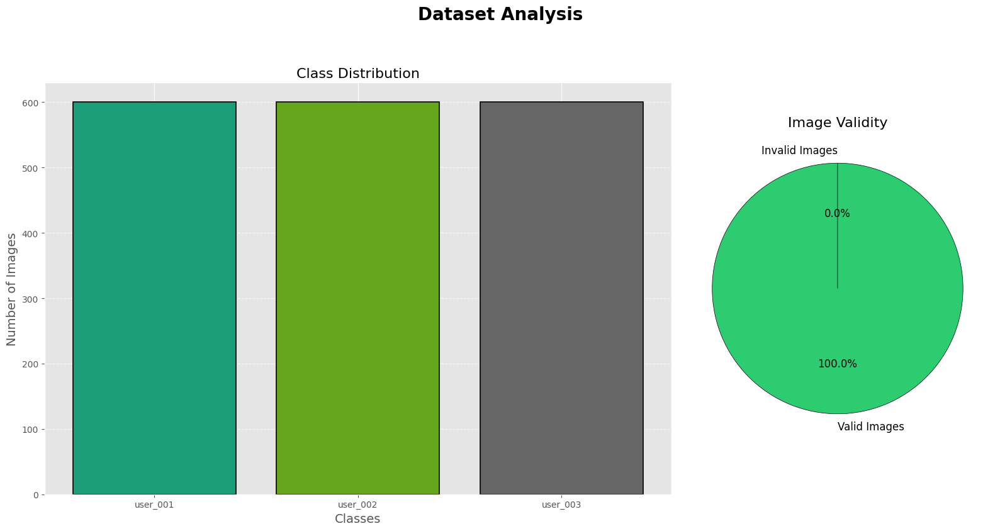

In [23]:
import matplotlib.pyplot as plt

def verify_dataset(dataset_dir):
    if not os.path.exists(dataset_dir):
        print(f"The dataset folder '{dataset_dir}' does not exist.")
        return

    class_counts = {}
    total_images = 0
    image_sizes = set()
    color_modes = set()
    invalid_images = 0

    # Counters for different types of invalid images
    too_small_images = 0
    blank_images = 0
    unacceptable_color_mode_images = 0
    corrupted_images = 0

    for class_name in os.listdir(dataset_dir):
        class_path = os.path.join(dataset_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        class_counts[class_name] = 0

        for image_name in os.listdir(class_path):
            image_path = os.path.join(class_path, image_name)

            try:
                with Image.open(image_path) as img:
                    img.load()

                    if img.size[0] < IMG_SIZE[0] or img.size[1] < IMG_SIZE[1]:
                        print(f"Image {image_path} is too small: {img.size}")
                        invalid_images += 1
                        too_small_images += 1
                        continue

                    img_array = np.array(img)
                    if img_array.std() == 0:
                        print(f"Image {image_path} is blank.")
                        invalid_images += 1
                        blank_images += 1
                        continue

                    if img.mode != COLOR_MODE:
                        print(f"Image {image_path} has unacceptable color mode: {img.mode}")
                        invalid_images += 1
                        unacceptable_color_mode_images += 1
                        continue

                    class_counts[class_name] += 1
                    total_images += 1
                    image_sizes.add(img.size)
                    color_modes.add(img.mode)

            except (IOError, OSError) as e:
                print(f"Error reading image {image_path}: {e}")
                invalid_images += 1
                corrupted_images += 1

    # Display the analysis results
    print(f"\nDataset Analysis for '{os.path.abspath(dataset_dir)}':\n")
    print(f"Number of classes: {len(class_counts)}")
    for class_name, count in class_counts.items():
        print(f"- {class_name}: {count} samples")
    print(f"\nTotal valid images: {total_images}")
    print(f"Image sizes: {image_sizes}")
    print(f"Color modes: {color_modes}")
    if invalid_images > 0:
        print(f"\nNumber of invalid images: {invalid_images}")
        print(f"- Corrupted images: {corrupted_images}")
        print(f"- Images too small: {too_small_images}")
        print(f"- Blank images: {blank_images}")
        print(f"- Unacceptable color modes: {unacceptable_color_mode_images}")

    # Generate graphs for visualization
    generate_graphs_side_by_side(class_counts, total_images, invalid_images)

def generate_graphs_side_by_side(class_counts, total_images, invalid_images):
    colors = plt.cm.Dark2(np.linspace(0, 1, len(class_counts)))

    fig, axes = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [2, 1]})
    fig.suptitle('Dataset Analysis', fontsize=20, fontweight='bold', y=1.05)

    # Bar chart for class distribution
    axes[0].bar(class_counts.keys(), class_counts.values(), color=colors, edgecolor='black', linewidth=1.2)
    axes[0].set_title('Class Distribution', fontsize=16)
    axes[0].set_xlabel('Classes', fontsize=14)
    axes[0].set_ylabel('Number of Images', fontsize=14)
    axes[0].grid(axis='y', linestyle='--', alpha=0.7)

    # Pie chart for image validity
    labels = ['Valid Images', 'Invalid Images']
    sizes = [total_images, invalid_images]
    pie_colors = ['#2ecc71', '#e74c3c']
    wedges, texts, autotexts = axes[1].pie(
        sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=pie_colors, textprops={'fontsize': 12}
    )
    for wedge in wedges:
        wedge.set_edgecolor('black')
    axes[1].set_title('Image Validity', fontsize=16)

    plt.tight_layout()
    plt.show()

# Run the verification
verify_dataset(DATASET_DIR)

User 'user_001': Total images = 600


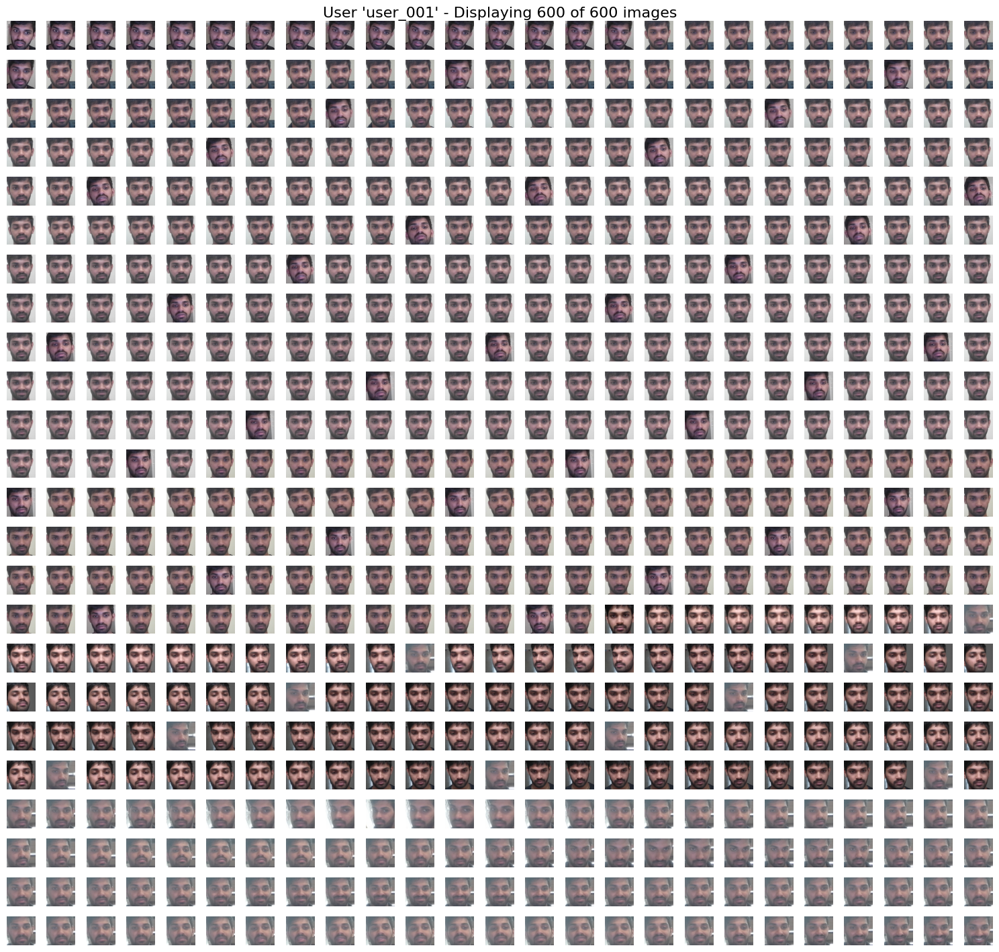

User 'user_002': Total images = 600


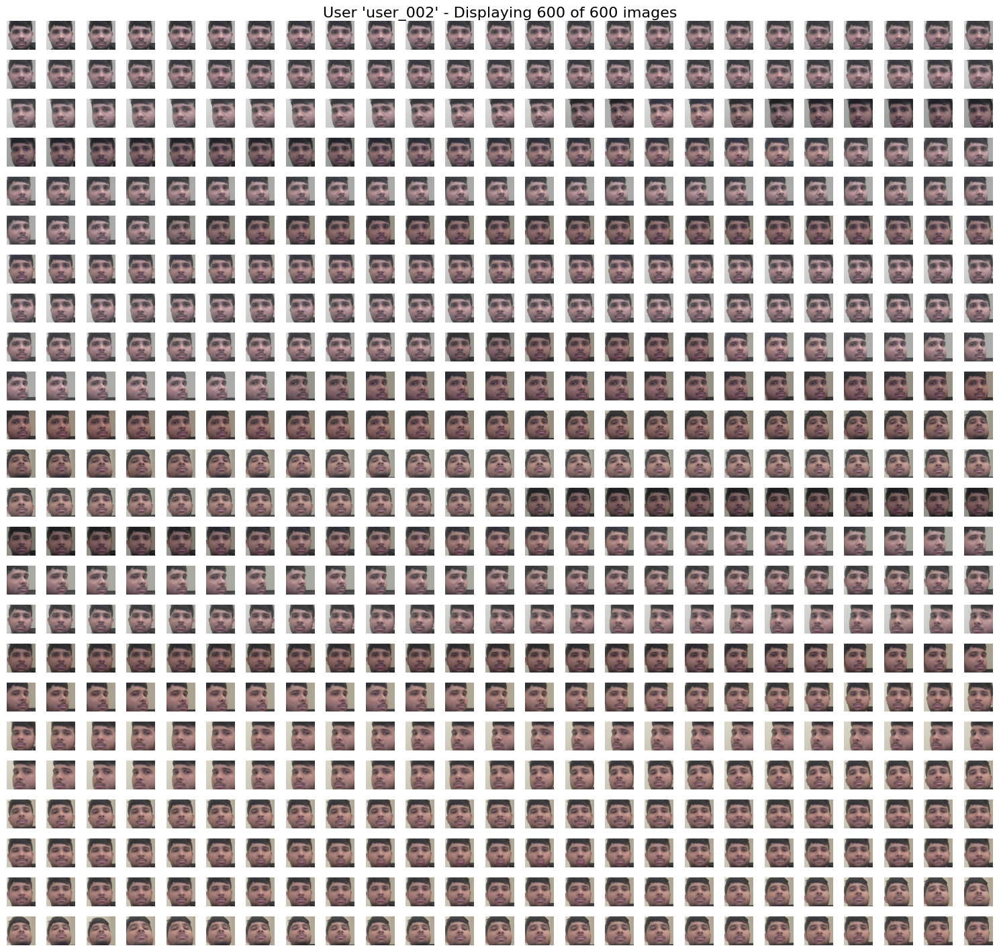

User 'user_003': Total images = 600


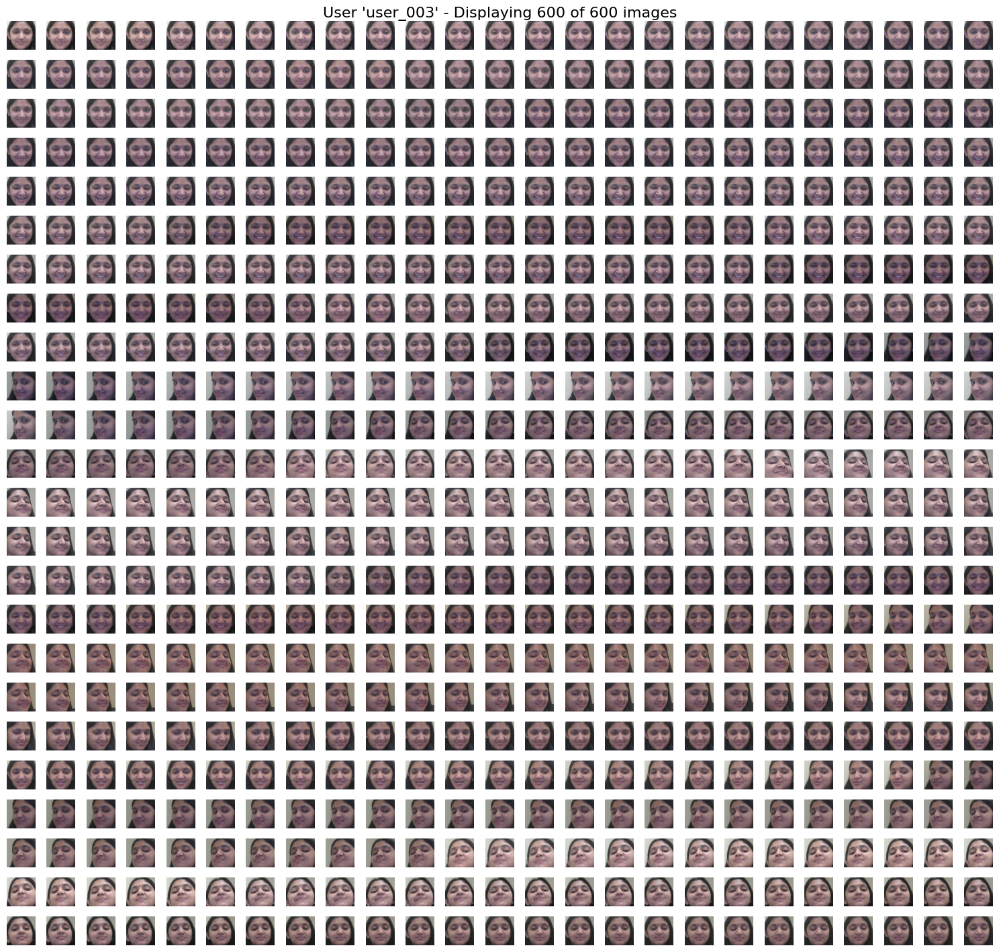

In [24]:
def plot_images_grouped_by_user(dataset_dir, max_images=50):
    # Dictionary to store user-wise images
    user_images = {}

    # Collect images for each user
    for user in os.listdir(dataset_dir):
        user_dir = os.path.join(dataset_dir, user)
        if os.path.isdir(user_dir):
            image_paths = [os.path.join(user_dir, f) for f in os.listdir(user_dir) if f.endswith('.jpg')]
            user_images[user] = image_paths

    # Display images grouped by user
    for user, image_paths in user_images.items():
        print(f"User '{user}': Total images = {len(image_paths)}")

        # Limit the number of images to display
        display_images = image_paths[:max_images]

        # Load images for display
        images = []
        titles = []
        for img_path in display_images:
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for display
            images.append(img)
            titles.append(os.path.basename(img_path))

        # Determine the grid size
        grid_size = int(len(images)**0.5) + 1

        # Plot images in a grid for the current user
        plt.figure(figsize=(15, 15))
        for i, (img, title) in enumerate(zip(images, titles)):
            plt.subplot(grid_size, grid_size, i + 1)
            plt.imshow(img)
            plt.axis('off')
        plt.suptitle(f"User '{user}' - Displaying {len(display_images)} of {len(image_paths)} images", fontsize=16)
        plt.tight_layout()
        plt.show()

plot_images_grouped_by_user(DATASET_DIR, max_images=600)

## DATA PREPROCESSING

Found 1440 images belonging to 3 classes.
Found 360 images belonging to 3 classes.

Training Data Samples | Train images shape: (32, 224, 224, 3), labels shape: (32, 3)


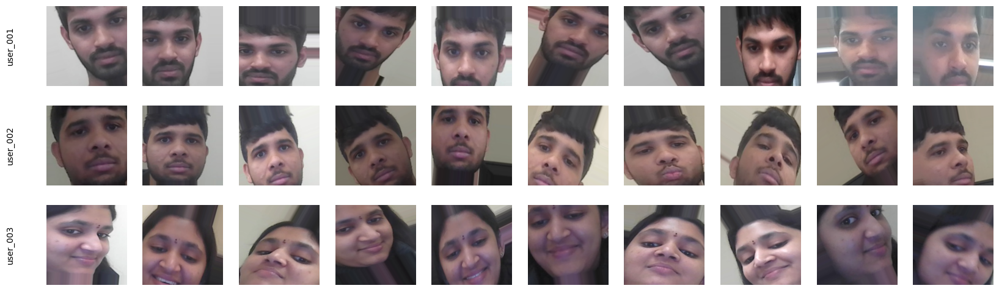


Validation Data Samples | Validation images shape: (32, 224, 224, 3), labels shape: (32, 3)


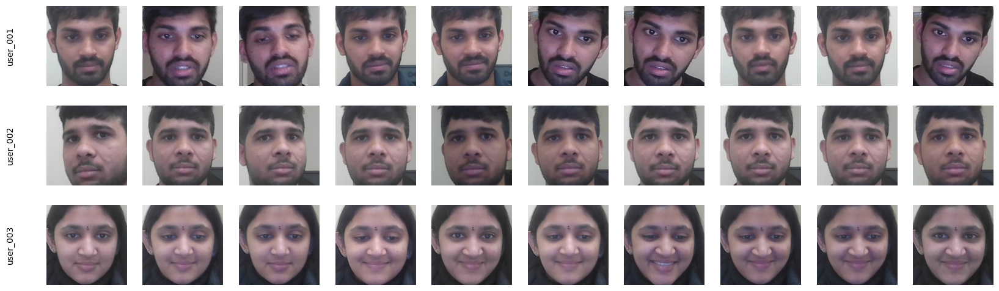

In [25]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
import random

# Define constants
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 20
LEARNING_RATE = 1e-4

# Include validation_split in ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values to [0, 1]
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest",
    brightness_range=[0.8, 1.2],  # Random brightness adjustments
    validation_split=0.2  # Set validation split
)

# Use the same rescaling for validation data, but without augmentation
val_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2  # Set validation split
)

# Training and Validation data loaders
train_data = train_datagen.flow_from_directory(
    "dataset",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="training",
    shuffle=True
)

val_data = val_datagen.flow_from_directory(
    "dataset",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="validation",
    shuffle=True
)

# Convert data generator output to TensorFlow Dataset for consistency
def preprocess_generator(generator):
    for images, labels in generator:
        yield tf.convert_to_tensor(images, dtype=tf.float32), tf.convert_to_tensor(labels, dtype=tf.float32)

train_dataset = tf.data.Dataset.from_generator(
    lambda: preprocess_generator(train_data),
    output_signature=(
        tf.TensorSpec(shape=(None, IMG_SIZE[0], IMG_SIZE[1], 3), dtype=tf.float32),
        tf.TensorSpec(shape=(None, len(train_data.class_indices)), dtype=tf.float32)
    )
)

val_dataset = tf.data.Dataset.from_generator(
    lambda: preprocess_generator(val_data),
    output_signature=(
        tf.TensorSpec(shape=(None, IMG_SIZE[0], IMG_SIZE[1], 3), dtype=tf.float32),
        tf.TensorSpec(shape=(None, len(val_data.class_indices)), dtype=tf.float32)
    )
)

# Display 10 random images per class
def display_random_images(data_generator, num_samples=10):
    class_labels = {v: k for k, v in data_generator.class_indices.items()}
    images_by_class = {class_name: [] for class_name in class_labels.values()}
    for images, labels in data_generator:
        for img, label in zip(images, labels):
            class_name = class_labels[np.argmax(label)]
            images_by_class[class_name].append(img)
        if all(len(images) >= num_samples for images in images_by_class.values()):
            break
    num_classes = len(images_by_class)
    fig, axes = plt.subplots(num_classes, num_samples, figsize=(num_samples * 2, num_classes * 2))
    for row, (class_name, images) in enumerate(images_by_class.items()):
        random_samples = random.sample(images, num_samples)
        for col, img in enumerate(random_samples):
            ax = axes[row, col]
            ax.imshow(img)
            ax.axis("off")
            if col == 0:
                ax.text(-0.5, 0.5, f"{class_name}", fontsize=10, va="center", rotation=90, transform=ax.transAxes)
    plt.show()

# Display random samples
for images, labels in train_dataset.take(1):
    print(f"\nTraining Data Samples | Train images shape: {images.shape}, labels shape: {labels.shape}")
    display_random_images(train_data, num_samples=10)

for images, labels in val_dataset.take(1):
    print(f"\nValidation Data Samples | Validation images shape: {images.shape}, labels shape: {labels.shape}")
    display_random_images(val_data, num_samples=10)

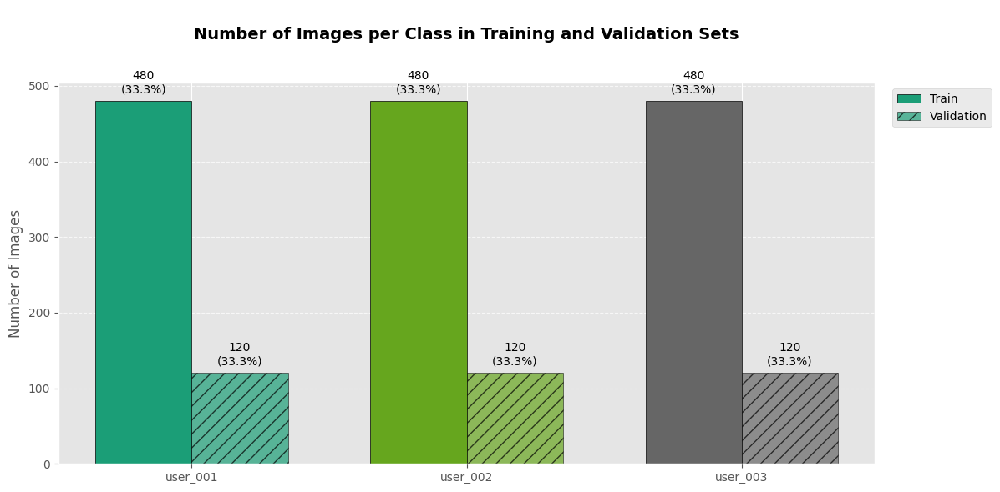

In [26]:
import numpy as np
import matplotlib.pyplot as plt

def plot_data_distribution(train_generator, val_generator):
    # Get class labels and indices
    class_indices = train_generator.class_indices
    classes = list(class_indices.keys())
    num_classes = len(classes)
    
    # Get counts per class in training data
    train_counts = np.zeros(num_classes, dtype=int)
    for i in range(num_classes):
        train_counts[i] = np.sum(train_generator.classes == i)
    
    # Get counts per class in validation data
    val_counts = np.zeros(num_classes, dtype=int)
    for i in range(num_classes):
        val_counts[i] = np.sum(val_generator.classes == i)
    
    # Calculate total counts for percentages
    total_train = np.sum(train_counts)
    total_val = np.sum(val_counts)
    
    # Plot grouped bar chart
    x = np.arange(num_classes)  # label locations
    width = 0.35  # width of the bars
    
    plt.style.use('ggplot')  # Use a nicer style
    fig, ax = plt.subplots(figsize=(12, 6))
    
    # Generate a color map for classes
    cmap = plt.get_cmap('Dark2')
    class_colors = [cmap(i) for i in np.linspace(0, 1, num_classes)] 
    
    # Bars for training data
    rects1 = ax.bar(x - width/2, train_counts, width, label='Train', color=class_colors, edgecolor='black')
    
    # Bars for validation data
    rects2 = ax.bar(x + width/2, val_counts, width, label='Validation', color=class_colors, edgecolor='black', alpha=0.7, hatch='//')
    
    # Add labels, title, and custom x-axis tick labels
    ax.set_ylabel('Number of Images', fontsize=12)
    ax.set_title('\nNumber of Images per Class in Training and Validation Sets\n\n', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(classes, fontsize=10)
    ax.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Attach a text label above each bar displaying its height and percentage
    def autolabel(rects, counts, total):
        """Attach a text label above each bar displaying its count and percentage."""
        for rect, count in zip(rects, counts):
            height = rect.get_height()
            if height > 0:
                percentage = (count / total) * 100
                ax.annotate(f'{int(count)}\n({percentage:.1f}%)',
                            xy=(rect.get_x() + rect.get_width() / 2, height),
                            xytext=(0, 5),  # 5 points vertical offset
                            textcoords="offset points",
                            ha='center', va='bottom', fontsize=10, rotation=0)
    
    autolabel(rects1, train_counts, total_train)
    autolabel(rects2, val_counts, total_val)
    
    fig.tight_layout()
    plt.show()
    
# Plot data distribution
plot_data_distribution(train_data, val_data)


## GPU SETUP

In [2]:
!python -m pip install "tensorflow<2.11" --force-reinstall

import tensorflow as tf

# GPU Configuration: Enable memory growth and print GPU details
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("GPU memory growth enabled.\n")
        
        # Print detailed GPU information
        gpu_details = tf.config.experimental.get_memory_info('GPU:0')
        print("Detailed GPU Information:")
        for idx, gpu in enumerate(gpus):
            print(f"GPU {idx}: {gpu.name}")
            print(f"Memory Info: {gpu_details}")

    except RuntimeError as e:
        print(f"Error configuring GPU: {e}")
else:
    print("No GPUs found. Training will run on CPU.")

  You can safely remove it manually.
  You can safely remove it manually.
  You can safely remove it manually.
  You can safely remove it manually.
  You can safely remove it manually.
  You can safely remove it manually.
  You can safely remove it manually.
  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
onnx 1.17.0 requires protobuf>=3.20.2, but you have protobuf 3.19.6 which is incompatible.
tensorflow-intel 2.18.0 requires keras>=3.5.0, but you have keras 2.10.0 which is incompatible.
tensorflow-intel 2.18.0 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<6.0.0dev,>=3.20.3, but you have protobuf 3.19.6 which is incompatible.
tensorflow-intel 2.18.0 requires tensorboard<2.19,>=2.18, but you have tensorboard 2.10.1 which is incompatible.


  Using cached tensorflow-2.10.1-cp39-cp39-win_amd64.whl.metadata (3.1 kB)
  Using cached absl_py-2.1.0-py3-none-any.whl.metadata (2.3 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl.metadata (4.4 kB)
  Using cached flatbuffers-24.3.25-py2.py3-none-any.whl.metadata (850 bytes)
  Using cached gast-0.4.0-py3-none-any.whl.metadata (1.1 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl.metadata (814 bytes)
  Using cached h5py-3.12.1-cp39-cp39-win_amd64.whl.metadata (2.5 kB)
  Using cached Keras_Preprocessing-1.1.2-py2.py3-none-any.whl.metadata (1.9 kB)
  Using cached libclang-18.1.1-py2.py3-none-win_amd64.whl.metadata (5.3 kB)
  Using cached numpy-2.0.2-cp39-cp39-win_amd64.whl.metadata (59 kB)
  Using cached opt_einsum-3.4.0-py3-none-any.whl.metadata (6.3 kB)
  Using cached packaging-24.2-py3-none-any.whl.metadata (3.2 kB)
  Using cached protobuf-3.19.6-cp39-cp39-win_amd64.whl.metadata (807 bytes)
  Using cached setuptools-75.6.0-py3-none-any.whl.metadata (6.7 kB)
  Using cac

TypeError: __init__() got an unexpected keyword argument 'metaclass'

## MODEL DEVELOPMENT

In [4]:
# Import necessary libraries
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np
import random
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

# Define constants
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 20
LEARNING_RATE = 1e-4
DATASET_DIR = 'dataset'

# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values to [0, 1]
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    validation_split=0.2  # Set validation split
)

# Validation data generator (only rescaling)
val_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Prepare train and validation generators
train_generator = train_datagen.flow_from_directory(
    DATASET_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

validation_generator = val_datagen.flow_from_directory(
    DATASET_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

# Get number of classes
num_classes = len(train_generator.class_indices)

# Build the model using VGG16
# Load the base model with pre-trained weights and exclude the top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))

# Freeze the base model layers to prevent them from training
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling reduces the spatial dimensions
x = Dense(256, activation='relu')(x)  # Add a fully connected layer
x = Dropout(0.5)(x)  # Add dropout for regularization
predictions = Dense(num_classes, activation='softmax')(x)  # Final layer with softmax activation

# Create the model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model with an optimizer and loss function suitable for multi-class classification
optimizer = Adam(learning_rate=LEARNING_RATE)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary to inspect the architecture
model.summary()

# Train the model using the generators
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // BATCH_SIZE
)

# Save the trained model for future use
model.save('face_recognition_vgg16.h5')

# Plot training & validation accuracy values
plt.figure(figsize=(8, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.title('Model Accuracy', fontsize=16)
plt.ylabel('Accuracy', fontsize=14)
plt.xlabel('Epoch', fontsize=14)
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(8, 6))
plt.plot(history.history['loss'], label='Training Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.title('Model Loss', fontsize=16)
plt.ylabel('Loss', fontsize=14)
plt.xlabel('Epoch', fontsize=14)
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


Found 1440 images belonging to 3 classes.
Found 360 images belonging to 3 classes.


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         131,3

 Total params: 14,846,787 (56.64 MB)

 Trainable params: 132,099 (516.01 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

C:\Users\Mohith\AppData\Roaming\Python\Python39\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3193 - loss: 1.2691

C:\Users\Mohith\AppData\Roaming\Python\Python39\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


45/45 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.3196 - loss: 1.2681 - val_accuracy: 0.6051 - val_loss: 1.0257
Epoch 2/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3913 - loss: 1.1435

KeyboardInterrupt: 

Cause: Unable to locate the source code of <function Model.make_predict_function.<locals>.predict_function at 0x00000231B1949EE0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
1/1 [==============================] - 0s 158ms/step


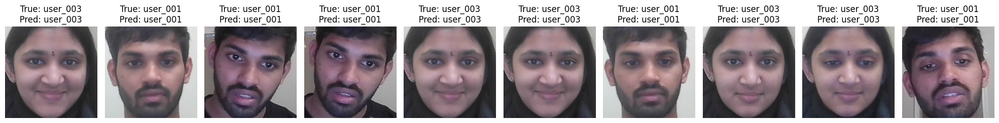

In [53]:
import matplotlib.pyplot as plt
import random
import numpy as np

# Ensure val_images and val_labels are loaded from the validation dataset
val_images, val_labels = next(iter(val_dataset))  # Load a batch of validation images and labels

# Predict on the validation batch
predictions = model.predict(val_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(val_labels, axis=1)

# Map class indices to class names
class_indices = train_data.class_indices  # Replace with your mapping if not in memory
class_labels = {v: k for k, v in class_indices.items()}  # Reverse the mapping

true_class_names = [class_labels[i] for i in true_classes]
predicted_class_names = [class_labels[i] for i in predicted_classes]

# Randomly select 5 images to display
num_samples = 10
random_indices = random.sample(range(len(val_images)), num_samples)

# Plot the selected images with true and predicted labels
fig, axes = plt.subplots(1, num_samples, figsize=(20, 15))
for i, idx in enumerate(random_indices):
    ax = axes[i]
    ax.imshow(val_images[idx])
    ax.axis("off")
    ax.set_title(f"True: {true_class_names[idx]}\nPred: {predicted_class_names[idx]}")
plt.tight_layout()
plt.show()


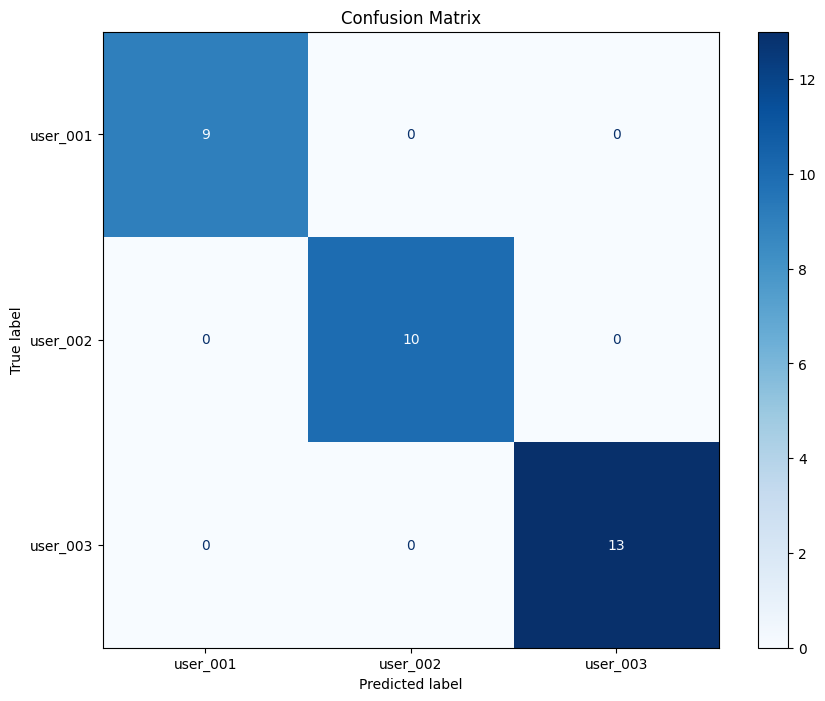

Classification Report:
              precision    recall  f1-score   support

    user_001       1.00      1.00      1.00         9
    user_002       1.00      1.00      1.00        10
    user_003       1.00      1.00      1.00        13

    accuracy                           1.00        32
   macro avg       1.00      1.00      1.00        32
weighted avg       1.00      1.00      1.00        32


Model Metrics:
Accuracy: 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1 Score (weighted): 1.0000


In [54]:
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
)
import matplotlib.pyplot as plt
import numpy as np

# Define class labels (must match your dataset)
target_names = ["user_001", "user_002", "user_003"]  # Add all your class labels

# Generate the confusion matrix
cm = confusion_matrix(true_classes, predicted_classes, labels=range(len(target_names)))

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names)

# Set up the figure for the matrix
fig, ax = plt.subplots(figsize=(10, 8))
disp.plot(cmap=plt.cm.Blues, ax=ax)
plt.title("Confusion Matrix")
plt.show()

# Print classification report
print("Classification Report:")
report = classification_report(true_classes, predicted_classes, target_names=target_names, zero_division=0)
print(report)

# Calculate individual metrics
accuracy = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average="weighted", zero_division=0)
recall = recall_score(true_classes, predicted_classes, average="weighted", zero_division=0)
f1 = f1_score(true_classes, predicted_classes, average="weighted", zero_division=0)

# Display calculated metrics
print("\nModel Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (weighted): {precision:.4f}")
print(f"Recall (weighted): {recall:.4f}")
print(f"F1 Score (weighted): {f1:.4f}")

# If probabilities are available for ROC AUC
if "predicted_probabilities" in locals():  # Ensure probabilities exist
    try:
        roc_auc = roc_auc_score(
            true_classes, predicted_probabilities, multi_class="ovr", average="weighted"
        )
        print(f"ROC AUC Score: {roc_auc:.4f}")
    except ValueError:
        print("ROC AUC Score could not be computed: Check if probabilities are correctly formatted.")


## EXPORT MODEL

In [262]:
# Save the model using the recommended format
model.save("FacialRecognition2.keras", save_format="keras")

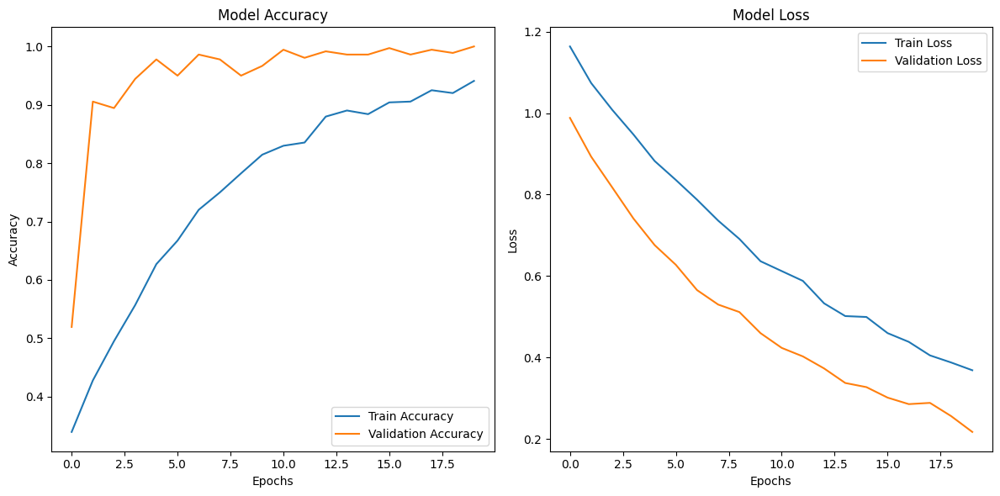

In [55]:
plt.figure(figsize=(12, 6))
# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history["accuracy"], label="Train Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.title("Model Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history["loss"], label="Train Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.title("Model Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()


## REAL_TIME IDENTITY DETECTION using Trained Model

In [1]:
import os
import cv2
import numpy as np
import tensorflow as tf

# Load the saved model
model = tf.keras.models.load_model("FacialRecognition2.keras")

# Define class indices (must match the original training setup)
class_indices = {
    0: "Mohith",
    1: "Narendra",
    2: "Sathwika",
    3: "Karthik"
    # Add more classes as per your dataset
}
class_labels = {v: k for k, v in class_indices.items()}  # Reverse the mapping

# Define image size for the model input
IMG_SIZE = (224, 224)  # Replace with the input size of your model
UNKNOWN_THRESHOLD = 0.5  # Confidence threshold for "Unknown" detection

# Load Haar Cascade for face detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Open a connection to the webcam
cap = cv2.VideoCapture(0)  # Use 0 for the default webcam; adjust for external cameras

print("Starting real-time facial recognition... Press 'q' to exit.")

# Real-time prediction loop
while True:
    ret, frame = cap.read()  # Read a frame from the webcam
    if not ret:
        print("Failed to capture frame. Exiting...")
        break

    # Convert to grayscale for face detection
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the frame
    faces = face_cascade.detectMultiScale(gray_frame, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    # Process each detected face
    for (x, y, w, h) in faces:
        # Extract the face region
        face_roi = frame[y:y+h, x:x+w]

        # Preprocess the face ROI
        face_resized = cv2.resize(face_roi, IMG_SIZE)  # Resize to match model input size
        face_normalized = face_resized / 255.0  # Normalize pixel values to range [0, 1]
        face_array = np.expand_dims(face_normalized, axis=0)  # Add batch dimension

        # Make a prediction
        predictions = model.predict(face_array)
        confidence_scores = predictions[0]  # Extract the confidence scores for all classes
        predicted_class = np.argmax(confidence_scores)  # Get the index of the highest probability
        predicted_confidence = confidence_scores[predicted_class]  # Confidence score of the prediction

        # Handle "Unknown" class if confidence is below the threshold
        if predicted_confidence < UNKNOWN_THRESHOLD:
            predicted_class_name = "Unknown"
        else:
            predicted_class_name = class_indices.get(predicted_class, "Unknown")

        # Draw a rectangle around the face
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)

        # Display the prediction and confidence
        text = f"{predicted_class_name} ({predicted_confidence * 100:.2f}%)"
        cv2.putText(frame, text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

    # Show the video feed
    cv2.imshow("Real-Time Facial Recognition", frame)

    # Break the loop if 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the webcam and close all OpenCV windows
cap.release()
cv2.destroyAllWindows()


Starting real-time facial recognition... Press 'q' to exit.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━

(-0.5, 978.5, 786.5, -0.5)

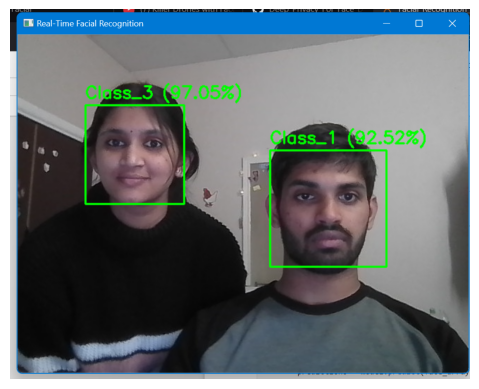

In [236]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Corrected file path
image_path = r"C:\Users\Mohith\OneDrive\Pictures\Screenshots\Screenshot 2024-11-26 213155.png"

# Open and display the image
img1 = mpimg.imread(image_path)
img2 = mpimg.imread(r"C:\Users\Mohith\OneDrive\Pictures\Screenshots\Screenshot 2024-11-26 231228.png")

plt.imshow(img1)

plt.axis('off')

(-0.5, 948.5, 764.5, -0.5)

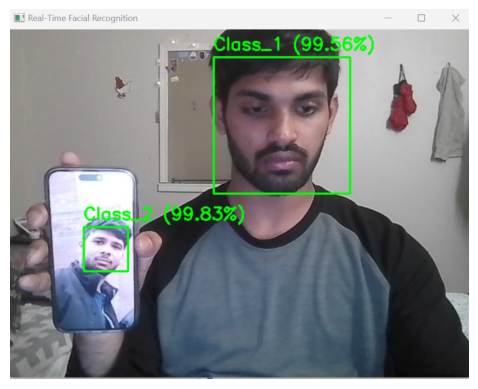

In [238]:
plt.imshow(img2)
plt.axis('off')

In [19]:
from PIL import Image
print("Pillow is installed and ready to use.")


Pillow is installed and ready to use.
